<center><h1>Kuyesera AI Disaster Damage and Displacement Challenge Starter Notebook</h1></center>

In March 2023, Cyclone Freddy unleashed devastating floods in Blantyre, Malawi, leaving a trail of destruction across the region. Communities like Chilobwe on Soche Mountain bore the brunt of the disaster due to vulnerabilities such as inadequate drainage, deforestation, and unregulated urban sprawl. The impact of the floods was compounded by societal inequalities, with women, pregnant women, and young girls facing significant barriers in recovery, including loss of shelter, limited healthcare access, and prolonged displacement.

Your mission is to develop a machine learning model capable of identifying the locations of houses and assessing whether they were damaged by Cyclone Freddy.

The solution will involve training on the xBD dataset and testing on a hand-labeled dataset curated by the Kuyesera AI Lab. Key to this challenge is the 6-month time gap between pre- and post-disaster imagery, reflecting the real-world complexities of post-disaster assessments.

As part of this challenge, data from the Amazon Sustainability Data Initiative (ASDI) will be used. ASDI is Amazon's tech-for-good program that is helping researchers, scientists, and innovators around the world advance their work on sustainability-related research, including climate change. The program provides publicly-available access to important scientific data on AWS that can be otherwise hard for researchers to access or analyse.

#### Import libraries

In [ ]:
# Standard library imports
import json
import multiprocessing
import os
import warnings
from collections import Counter
from functools import partial
from pathlib import Path
import tarfile
import shutil

# Data manipulation and analysis
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

# Visualization
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

# Geospatial libraries
import geopandas as gpd
import pyproj
import pyproj.datadir
import pystac_client
import rasterio
import rioxarray
import xarray as xr
from pyproj import CRS, Transformer
from rasterio.mask import mask
from rasterio.plot import reshape_as_raster
from rasterio.transform import from_bounds
from shapely import wkt
from shapely.geometry import Polygon, box
from shapely.wkt import loads

# AWS
import boto3
from botocore import UNSIGNED
from botocore.client import Config

# PyTorch and computer vision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNN, MaskRCNNPredictor
from torchvision.models.detection.roi_heads import RoIHeads
from torchvision.transforms import functional as F

# Settings
pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)
warnings.filterwarnings("ignore")

#### Set data directories

In [ ]:
# Set data dir path
DATA_DIR = Path("")

# Preview data files available
os.listdir(DATA_DIR)

['benchmark.csv',
 'SampleSubmission.csv',
 'test_images.zip',
 'test_image_coords.csv',
 'Starter Notebook Kuyesera.ipynb',
 'xview2_geotiff.tgz']

#### Extract / unzip test images

In [ ]:
# Extract test images
shutil.unpack_archive(DATA_DIR / "test_images.zip")

#### Preparing test data

In [5]:
# Load test image coords and image paths
test_coords = pd.read_csv(DATA_DIR / "test_image_coords.csv")
test_pre_df = pd.Series(
    [
        x
        for x in Path("Images").glob("*.tif")
        if x.parts[-1].split(".")[0].split("_")[-2] == "pre"
    ]
).to_frame(name="pre_image_path")
test_post_df = pd.Series(
    [
        x
        for x in Path("Images").glob("*.tif")
        if x.parts[-1].split(".")[0].split("_")[-2] == "post"
    ]
).to_frame(name="post_image_path")

test_pre_df["id"] = [
    "_".join(x.parts[-1].split(".")[0].split("_")[:-2])
    for x in test_pre_df.pre_image_path
]
test_post_df["id"] = [
    "_".join(x.parts[-1].split(".")[0].split("_")[:-2])
    for x in test_post_df.post_image_path
]

test_df = test_pre_df.merge(test_post_df, how="left", on="id")
test_df = test_coords.merge(test_df, how="left", on="id")
test_df["flood_name"] = ["_".join(x.split("_")[:-1]) for x in test_df.id]


# Extract and add lat and lon bounds - to be used in downloading data from aws
def parse_coords(coord_str):
    # Remove parentheses
    coord_str = coord_str.strip("()")
    # Split by the semicolon
    lat_str, lon_str = coord_str.split(";")
    # Convert to float
    lat = float(lat_str)
    lon = float(lon_str)
    return lat, lon


# Add columns for min/max lat/lon
test_df["post_min_lon"] = None
test_df["post_max_lon"] = None
test_df["post_min_lat"] = None
test_df["post_max_lat"] = None

for idx, row in test_df.iterrows():
    # Parse all four corner coordinates
    corners = [
        parse_coords(row["pre_top_left"]),
        parse_coords(row["pre_top_right"]),
        parse_coords(row["pre_bottom_right"]),
        parse_coords(row["pre_bottom_left"]),
    ]

    # Extract all latitudes and longitudes into separate lists
    lats = [c[0] for c in corners]
    lons = [c[1] for c in corners]

    # Compute min/max latitude and longitude
    min_lat = min(lats)
    max_lat = max(lats)
    min_lon = min(lons)
    max_lon = max(lons)

    # Assign to DataFrame
    test_df.at[idx, "post_min_lat"] = min_lat
    test_df.at[idx, "post_max_lat"] = max_lat
    test_df.at[idx, "post_min_lon"] = min_lon
    test_df.at[idx, "post_max_lon"] = max_lon


# Preview test df
test_df.head()

,id,pre_top_left,pre_top_right,pre_bottom_right,pre_bottom_left,post_top_left,post_top_right,post_bottom_right,post_bottom_left,pre_image_path,post_image_path,flood_name,post_min_lon,post_max_lon,post_min_lat,post_max_lat
0,malawi-cyclone_00000000,(-15.824129507838975; 35.002070173540666),(-15.824129507838975; 35.003990425148785),(-15.825037409226914; 35.003990425148785),(-15.825037409226914; 35.002070173540666),(-15.824129507838975; 35.002070173540666),(-15.824129507838975; 35.003990425148785),(-15.825037409226914; 35.003990425148785),(-15.825037409226914; 35.002070173540666),Images/malawi-cyclone_00000000_pre_disaster.tif,Images/malawi-cyclone_00000000_post_disaster.tif,malawi-cyclone,35.00207,35.00399,-15.825037,-15.82413
1,malawi-cyclone_00000001,(-15.82512979754548; 35.00206749389429),(-15.82512979754548; 35.0039867934907),(-15.826038510517881; 35.0039867934907),(-15.826038510517881; 35.00206749389429),(-15.82512979754548; 35.00206749389429),(-15.82512979754548; 35.0039867934907),(-15.826038510517881; 35.0039867934907),(-15.826038510517881; 35.00206749389429),Images/malawi-cyclone_00000001_pre_disaster.tif,Images/malawi-cyclone_00000001_post_disaster.tif,malawi-cyclone,35.002067,35.003987,-15.826039,-15.82513
2,malawi-cyclone_00000002,(-15.826127561220138; 35.0020673603379),(-15.826127561220138; 35.00397265326528),(-15.827018452705842; 35.00397265326528),(-15.827018452705842; 35.0020673603379),(-15.826127561220138; 35.0020673603379),(-15.826127561220138; 35.00397265326528),(-15.827018452705842; 35.00397265326528),(-15.827018452705842; 35.0020673603379),Images/malawi-cyclone_00000002_pre_disaster.tif,Images/malawi-cyclone_00000002_post_disaster.tif,malawi-cyclone,35.002067,35.003973,-15.827018,-15.826128
3,malawi-cyclone_00000003,(-15.827132430009872; 35.002071721612694),(-15.827132430009872; 35.00394794261843),(-15.82799871302644; 35.00394794261843),(-15.82799871302644; 35.002071721612694),(-15.827132430009872; 35.002071721612694),(-15.827132430009872; 35.00394794261843),(-15.82799871302644; 35.00394794261843),(-15.82799871302644; 35.002071721612694),Images/malawi-cyclone_00000003_pre_disaster.tif,Images/malawi-cyclone_00000003_post_disaster.tif,malawi-cyclone,35.002072,35.003948,-15.827999,-15.827132
4,malawi-cyclone_00000004,(-15.828127278576133; 35.002067048093515),(-15.828127278576133; 35.003956188551655),(-15.828993396128368; 35.003956188551655),(-15.828993396128368; 35.002067048093515),(-15.828127278576133; 35.002067048093515),(-15.828127278576133; 35.003956188551655),(-15.828993396128368; 35.003956188551655),(-15.828993396128368; 35.002067048093515),Images/malawi-cyclone_00000004_pre_disaster.tif,Images/malawi-cyclone_00000004_post_disaster.tif,malawi-cyclone,35.002067,35.003956,-15.828993,-15.828127


#### Extract train images

In [ ]:
# Extract xview2_geotiff_path train data
# Data will be extracted to geotiffs dir
xview2_geotiff_path = DATA_DIR / "xview2_geotiff.tgz"

with tarfile.open(xview2_geotiff_path, "r:gz") as tar:
    tar.extractall()
print(f"Extraction complete")

In [7]:
# list of extracted dirs
os.listdir("geotiffs")

['tier1', 'hold', 'test', 'tier3']

#### Prepare train data

In [8]:
# Create a df with all the image and label paths
dfs = []
for dataset_path in tqdm(os.listdir("geotiffs")):
    image_paths = (Path("geotiffs") / dataset_path / "images").glob("*.tif")
    images_df = pd.Series(image_paths).to_frame(name="image_path")
    images_df["id"] = [
        "_".join(x.parts[-1].split(".")[0].split("_")[:-2])
        for x in images_df.image_path
    ]
    images_df["pre_post"] = [
        x.parts[-1].split(".")[0].split("_")[-2] for x in images_df.image_path
    ]

    label_paths = (Path("geotiffs") / dataset_path / "labels").glob("*.json")
    labels_df = pd.Series(label_paths).to_frame(name="label_path")
    labels_df["id"] = [
        "_".join(x.parts[-1].split(".")[0].split("_")[:-2])
        for x in labels_df.label_path
    ]
    labels_df["pre_post"] = [
        x.parts[-1].split(".")[0].split("_")[-2] for x in labels_df.label_path
    ]

    merged_df = images_df.merge(labels_df, how="left", on=["id", "pre_post"])
    merged_df = merged_df[["id", "pre_post", "image_path", "label_path"]]
    merged_df["dataset_type"] = dataset_path

    pre_df = merged_df[merged_df.pre_post == "pre"]
    post_df = merged_df[merged_df.pre_post == "post"]

    pre_df.columns = [f"pre_{x.replace('-', '_')}" for x in pre_df.columns]
    pre_df = pre_df.drop(["pre_pre_post"], axis=1)
    pre_df = pre_df.rename(columns={"pre_id": "id", "pre_dataset_type": "dataset_type"})

    post_df.columns = [f"post_{x.replace('-', '_')}" for x in post_df.columns]
    post_df = post_df.drop(["post_pre_post"], axis=1)
    post_df = post_df.rename(
        columns={"post_id": "id", "post_dataset_type": "dataset_type"}
    )

    merged_df = pre_df.merge(post_df, how="left", on=["id", "dataset_type"])

    dfs.append(merged_df)

df = pd.concat(dfs, ignore_index=True)
df["flood_name"] = ["_".join(x.split("_")[:-1]) for x in df.id]
df.head()

  0%|          | 0/4 [00:00<?, ?it/s]

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name
0,hurricane-michael_00000188,geotiffs/tier1/images/hurricane-michael_00000188_pre_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-michael_00000188_post_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_post_disaster.json,hurricane-michael
1,guatemala-volcano_00000025,geotiffs/tier1/images/guatemala-volcano_00000025_pre_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_pre_disaster.json,tier1,geotiffs/tier1/images/guatemala-volcano_00000025_post_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_post_disaster.json,guatemala-volcano
2,midwest-flooding_00000282,geotiffs/tier1/images/midwest-flooding_00000282_pre_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_pre_disaster.json,tier1,geotiffs/tier1/images/midwest-flooding_00000282_post_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_post_disaster.json,midwest-flooding
3,hurricane-matthew_00000234,geotiffs/tier1/images/hurricane-matthew_00000234_pre_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-matthew_00000234_post_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_post_disaster.json,hurricane-matthew
4,socal-fire_00001349,geotiffs/tier1/images/socal-fire_00001349_pre_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_pre_disaster.json,tier1,geotiffs/tier1/images/socal-fire_00001349_post_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_post_disaster.json,socal-fire


In [9]:
# Function to get overall bounds
def get_overall_bounds(label_path):
    with open(label_path, "r") as file:
        data = json.load(file)

    global_minx = float("inf")
    global_miny = float("inf")
    global_maxx = float("-inf")
    global_maxy = float("-inf")

    for poly_data in data["features"]["lng_lat"]:
        polygon = wkt.loads(poly_data["wkt"])
        minx, miny, maxx, maxy = polygon.bounds

        # Update global bounds
        if minx < global_minx:
            global_minx = minx
        if miny < global_miny:
            global_miny = miny
        if maxx > global_maxx:
            global_maxx = maxx
        if maxy > global_maxy:
            global_maxy = maxy

    # minx = min_lon, miny = min_lat, maxx = max_lon, maxy = max_lat
    return global_minx, global_miny, global_maxx, global_maxy

In [10]:
# Extract and add lat and lon bounds - to be used in downloading data from aws
df[["post_min_lon", "post_min_lat", "post_max_lon", "post_max_lat"]] = df[
    "post_label_path"
].apply(
    lambda path: pd.Series(
        get_overall_bounds(path),
        index=["post_min_lon", "post_min_lat", "post_max_lon", "post_max_lat"],
    )
)

df.head()

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat
0,hurricane-michael_00000188,geotiffs/tier1/images/hurricane-michael_00000188_pre_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-michael_00000188_post_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_post_disaster.json,hurricane-michael,-85.670920,30.166169,-85.669488,30.170476
1,guatemala-volcano_00000025,geotiffs/tier1/images/guatemala-volcano_00000025_pre_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_pre_disaster.json,tier1,geotiffs/tier1/images/guatemala-volcano_00000025_post_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_post_disaster.json,guatemala-volcano,-90.829368,14.405336,-90.827739,14.409878
2,midwest-flooding_00000282,geotiffs/tier1/images/midwest-flooding_00000282_pre_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_pre_disaster.json,tier1,geotiffs/tier1/images/midwest-flooding_00000282_post_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_post_disaster.json,midwest-flooding,-96.362146,36.203281,-96.359496,36.206958
3,hurricane-matthew_00000234,geotiffs/tier1/images/hurricane-matthew_00000234_pre_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-matthew_00000234_post_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_post_disaster.json,hurricane-matthew,-74.126908,18.579172,-74.123442,18.580799
4,socal-fire_00001349,geotiffs/tier1/images/socal-fire_00001349_pre_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_pre_disaster.json,tier1,geotiffs/tier1/images/socal-fire_00001349_post_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_post_disaster.json,socal-fire,inf,inf,-inf,-inf


In [11]:
# check how many images in total
df.shape

(11034, 11)

In [12]:
# check for duplicates or any missing values
df.isnull().sum().any(), df.duplicated().any()

(False, False)

In [13]:
# check dataset type counts
df.dataset_type.value_counts(normalize=True)

dataset_type
tier3    0.577216
tier1    0.253670
hold     0.084557
test     0.084557
Name: proportion, dtype: float64

#### Create train targets

In [14]:
# Create targets
# Function to count subtypes from a label path
def get_subtype_counts(label_path):
    with open(label_path, "r") as file:
        label_data = json.load(file)

    subtypes = [
        building["properties"]["subtype"] for building in label_data["features"]["xy"]
    ]
    return Counter(subtypes)


# Process each label_path and aggregate counts
all_counts = []
for label_path in df["post_label_path"]:
    subtype_counts = get_subtype_counts(label_path)
    all_counts.append(subtype_counts)

# Convert counts to DataFrame and combine with original DataFrame
counts_df = (
    pd.DataFrame(all_counts).fillna(0).astype(int)
)  # Fill NaN with 0 and cast to int
df = pd.concat([df, counts_df], axis=1)

# Drop un-classified, as the main target categories include no-damage, minor-damage, major-damage, destroyed
df = df.drop("un-classified", axis=1)

# Preview df
df.head()

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed
0,hurricane-michael_00000188,geotiffs/tier1/images/hurricane-michael_00000188_pre_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-michael_00000188_post_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_post_disaster.json,hurricane-michael,-85.670920,30.166169,-85.669488,30.170476,2,29,8,1
1,guatemala-volcano_00000025,geotiffs/tier1/images/guatemala-volcano_00000025_pre_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_pre_disaster.json,tier1,geotiffs/tier1/images/guatemala-volcano_00000025_post_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_post_disaster.json,guatemala-volcano,-90.829368,14.405336,-90.827739,14.409878,0,0,6,21
2,midwest-flooding_00000282,geotiffs/tier1/images/midwest-flooding_00000282_pre_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_pre_disaster.json,tier1,geotiffs/tier1/images/midwest-flooding_00000282_post_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_post_disaster.json,midwest-flooding,-96.362146,36.203281,-96.359496,36.206958,20,1,0,0
3,hurricane-matthew_00000234,geotiffs/tier1/images/hurricane-matthew_00000234_pre_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-matthew_00000234_post_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_post_disaster.json,hurricane-matthew,-74.126908,18.579172,-74.123442,18.580799,0,0,2,11
4,socal-fire_00001349,geotiffs/tier1/images/socal-fire_00001349_pre_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_pre_disaster.json,tier1,geotiffs/tier1/images/socal-fire_00001349_post_disaster.tif,geotiffs/tier1/labels/socal-fire_00001349_post_disaster.json,socal-fire,inf,inf,-inf,-inf,0,0,0,0


In [15]:
# Check stats of target
df.describe()  # data seems to have extreme outliers

,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed
count,1.103400e+04,1.103400e+04,1.103400e+04,1.103400e+04,11034.000000,11034.000000,11034.000000,11034.000000
mean,inf,inf,-inf,-inf,28.369857,3.340584,2.710169,2.860250
std,NaN,NaN,NaN,NaN,80.094072,18.812575,14.335390,20.117394
min,-1.549327e+02,-3.453147e+01,-inf,-inf,0.000000,0.000000,0.000000,0.000000
25%,-9.556878e+01,3.016147e+01,NaN,NaN,0.000000,0.000000,0.000000,0.000000
50%,-8.182415e+00,3.616891e+01,-9.922389e+01,2.654068e+01,1.000000,0.000000,0.000000,0.000000
75%,NaN,NaN,-7.785813e+01,3.413144e+01,20.000000,0.000000,0.000000,0.000000
max,inf,inf,1.389179e+02,4.002475e+01,1766.000000,618.000000,441.000000,1540.000000


#### Check for outliers

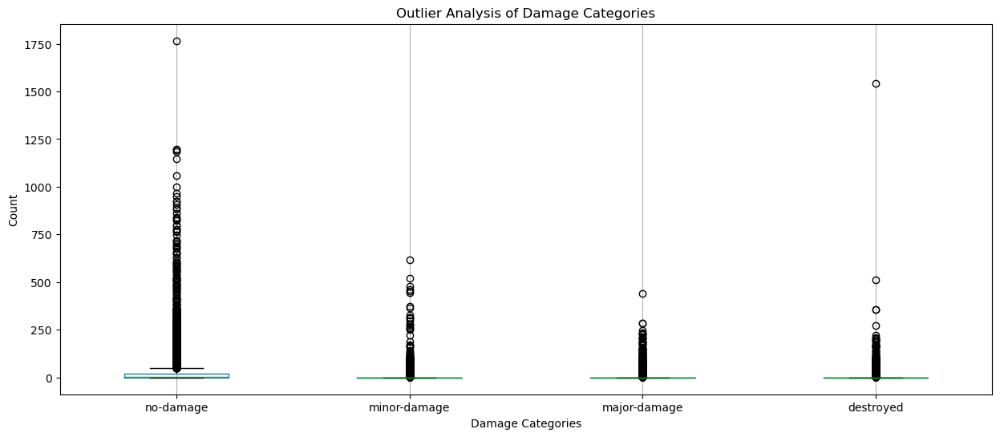

In [16]:
# Plot showing outliers
plt.figure(figsize=(15, 6))
df[["no-damage", "minor-damage", "major-damage", "destroyed"]].boxplot()
plt.title("Outlier Analysis of Damage Categories")
plt.ylabel("Count")
plt.xlabel("Damage Categories")
plt.grid(axis="y")
plt.show()  # Handling outliers can improve model performance

#### EDA of images

In [17]:
# Function to plot pre and post images
def plot_disaster_comparison(i, df):
    """
    Plot pre and post disaster images side by side with building damage annotations

    Args:
        i (int): Index of the row in dataframe
        df (pd.DataFrame): Dataframe containing image and label paths
    """
    # Get paths from dataframe
    row = df.iloc[i]
    pre_image_path = row.pre_image_path
    pre_label_path = row.pre_label_path
    post_image_path = row.post_image_path
    post_label_path = row.post_label_path
    id = row.id

    # Load images using rasterio
    with rasterio.open(pre_image_path) as src:
        pre_image = src.read()
    with open(pre_label_path, "r") as file:
        pre_data = json.load(file)
    with rasterio.open(post_image_path) as src:
        post_image = src.read()
    with open(post_label_path, "r") as file:
        post_data = json.load(file)

    # Get polygon lists
    pre_polygon_list = pre_data["features"]["xy"]
    post_polygon_list = post_data["features"]["xy"]

    # Define color mapping
    color_map = {
        "no-damage": (0, 255, 0),  # Green
        "minor-damage": (255, 255, 0),  # Yellow
        "major-damage": (255, 165, 0),  # Orange
        "destroyed": (255, 0, 0),  # Red
        "pre-disaster": (0, 255, 0),  # Green (same as no-damage)
    }

    # Create subplot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))

    # Plot pre-disaster image and polygons
    ax1.imshow(np.moveaxis(pre_image, 0, -1))
    for poly_data in pre_polygon_list:
        # Pre-disaster buildings are marked in green
        color = color_map["pre-disaster"]

        polygon = loads(poly_data["wkt"])
        x, y = polygon.exterior.xy

        ax1.plot(x, y, color=np.array(color) / 255, linewidth=2, label="pre-disaster")
        ax1.fill(x, y, alpha=0.3, color=np.array(color) / 255)

    # Remove duplicate labels in pre-image legend
    handles, labels = ax1.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys())
    ax1.set_title(f"Pre-Disaster ID: {id}")

    # Plot post-disaster image and polygons
    ax2.imshow(np.moveaxis(post_image, 0, -1))
    for poly_data in post_polygon_list:
        subtype = poly_data["properties"].get("subtype", "no-damage")
        color = color_map.get(subtype, (255, 255, 255))

        polygon = loads(poly_data["wkt"])
        x, y = polygon.exterior.xy

        ax2.plot(x, y, color=np.array(color) / 255, linewidth=2, label=subtype)
        ax2.fill(x, y, alpha=0.3, color=np.array(color) / 255)

    # Remove duplicate labels in post-image legend
    handles, labels = ax2.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax2.legend(by_label.values(), by_label.keys())
    ax2.set_title(f"Post-Disaster ID: {id}")

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print_damage_summary(pre_polygon_list, post_polygon_list)


def print_damage_summary(pre_polygon_list, post_polygon_list):
    """Print summary of damage counts"""
    pre_damage_counts = {"pre-disaster": len(pre_polygon_list)}

    post_damage_counts = {}
    for poly in post_polygon_list:
        subtype = poly["properties"].get("subtype", "no-damage")
        post_damage_counts[subtype] = post_damage_counts.get(subtype, 0) + 1

    print("\nDamage Summary:")
    print("Pre-disaster building count:", pre_damage_counts)
    print("Post-disaster building counts:", post_damage_counts)

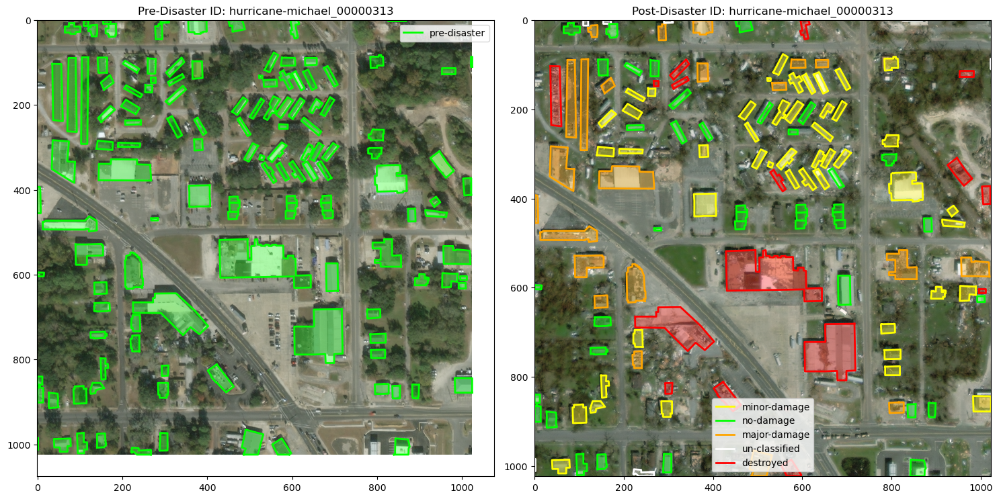


Damage Summary:
Pre-disaster building count: {'pre-disaster': 132}
Post-disaster building counts: {'minor-damage': 47, 'no-damage': 40, 'major-damage': 22, 'un-classified': 7, 'destroyed': 16}


In [18]:
plot_disaster_comparison(200, df)

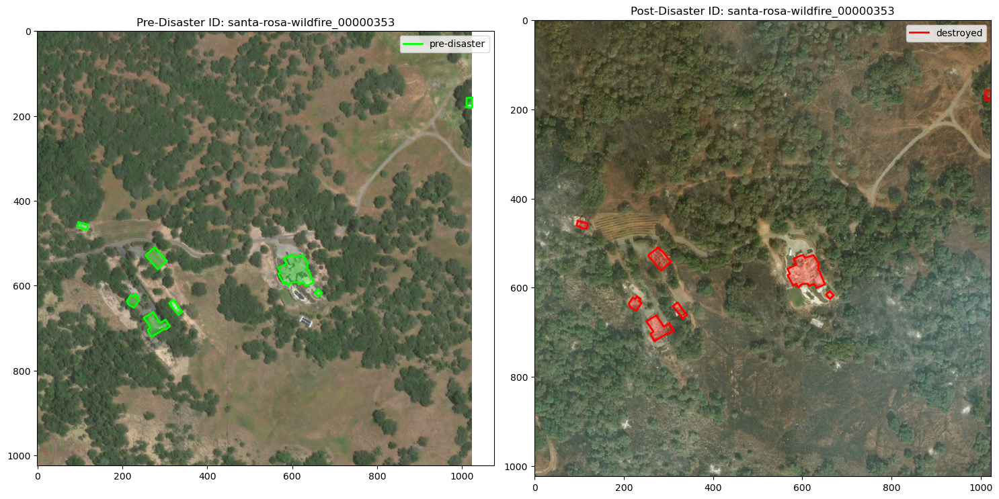


Damage Summary:
Pre-disaster building count: {'pre-disaster': 8}
Post-disaster building counts: {'destroyed': 8}


In [19]:
plot_disaster_comparison(25, df)

In [20]:
# Preview some images with lots of damaged buildings
df[df.destroyed > 200]

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed
106,santa-rosa-wildfire_00000063,geotiffs/tier1/images/santa-rosa-wildfire_00000063_pre_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000063_pre_disaster.json,tier1,geotiffs/tier1/images/santa-rosa-wildfire_00000063_post_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000063_post_disaster.json,santa-rosa-wildfire,-122.751726,38.471416,-122.746460,38.475557,29,0,1,206
161,santa-rosa-wildfire_00000155,geotiffs/tier1/images/santa-rosa-wildfire_00000155_pre_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000155_pre_disaster.json,tier1,geotiffs/tier1/images/santa-rosa-wildfire_00000155_post_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000155_post_disaster.json,santa-rosa-wildfire,-122.756971,38.475563,-122.751705,38.479702,84,1,0,203
494,palu-tsunami_00000182,geotiffs/tier1/images/palu-tsunami_00000182_pre_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000182_pre_disaster.json,tier1,geotiffs/tier1/images/palu-tsunami_00000182_post_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000182_post_disaster.json,palu-tsunami,119.914860,-0.943427,119.919437,-0.938818,79,0,24,511
1056,palu-tsunami_00000118,geotiffs/tier1/images/palu-tsunami_00000118_pre_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000118_pre_disaster.json,tier1,geotiffs/tier1/images/palu-tsunami_00000118_post_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000118_post_disaster.json,palu-tsunami,119.840683,-0.906532,119.845261,-0.901922,294,0,9,1540
1170,palu-tsunami_00000178,geotiffs/tier1/images/palu-tsunami_00000178_pre_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000178_pre_disaster.json,tier1,geotiffs/tier1/images/palu-tsunami_00000178_post_disaster.tif,geotiffs/tier1/labels/palu-tsunami_00000178_post_disaster.json,palu-tsunami,119.901118,-0.943439,119.905694,-0.938830,398,0,3,223
1335,santa-rosa-wildfire_00000084,geotiffs/tier1/images/santa-rosa-wildfire_00000084_pre_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000084_pre_disaster.json,tier1,geotiffs/tier1/images/santa-rosa-wildfire_00000084_post_disaster.tif,geotiffs/tier1/labels/santa-rosa-wildfire_00000084_post_disaster.json,santa-rosa-wildfire,-122.751698,38.479693,-122.746435,38.483824,11,0,0,207
2929,santa-rosa-wildfire_00000157,geotiffs/hold/images/santa-rosa-wildfire_00000157_pre_disaster.tif,geotiffs/hold/labels/santa-rosa-wildfire_00000157_pre_disaster.json,hold,geotiffs/hold/images/santa-rosa-wildfire_00000157_post_disaster.tif,geotiffs/hold/labels/santa-rosa-wildfire_00000157_post_disaster.json,santa-rosa-wildfire,-122.751712,38.475556,-122.746445,38.479690,0,0,0,271
4087,palu-tsunami_00000181,geotiffs/test/images/palu-tsunami_00000181_pre_disaster.tif,geotiffs/test/labels/palu-tsunami_00000181_pre_disaster.json,test,geotiffs/test/images/palu-tsunami_00000181_post_disaster.tif,geotiffs/test/labels/palu-tsunami_00000181_post_disaster.json,palu-tsunami,119.910280,-0.943432,119.914856,-0.938824,198,0,35,357
8238,joplin-tornado_00000147,geotiffs/tier3/images/joplin-tornado_00000147_pre_disaster.tif,geotiffs/tier3/labels/joplin-tornado_00000147_pre_disaster.json,tier3,geotiffs/tier3/images/joplin-tornado_00000147_post_disaster.tif,geotiffs/tier3/labels/joplin-tornado_00000147_post_disaster.json,joplin-tornado,-94.514369,37.061421,-94.509181,37.065641,1,4,20,355


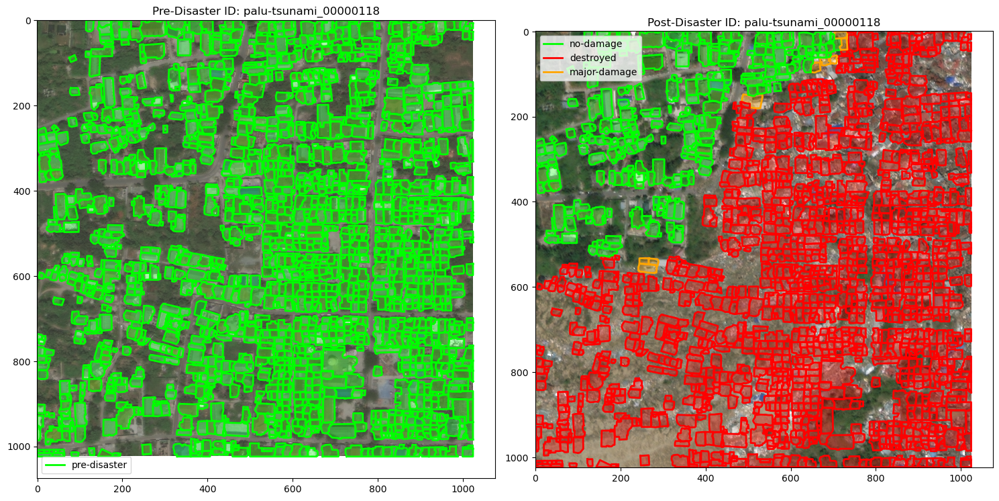


Damage Summary:
Pre-disaster building count: {'pre-disaster': 1843}
Post-disaster building counts: {'no-damage': 294, 'destroyed': 1540, 'major-damage': 9}


In [21]:
plot_disaster_comparison(1056, df)

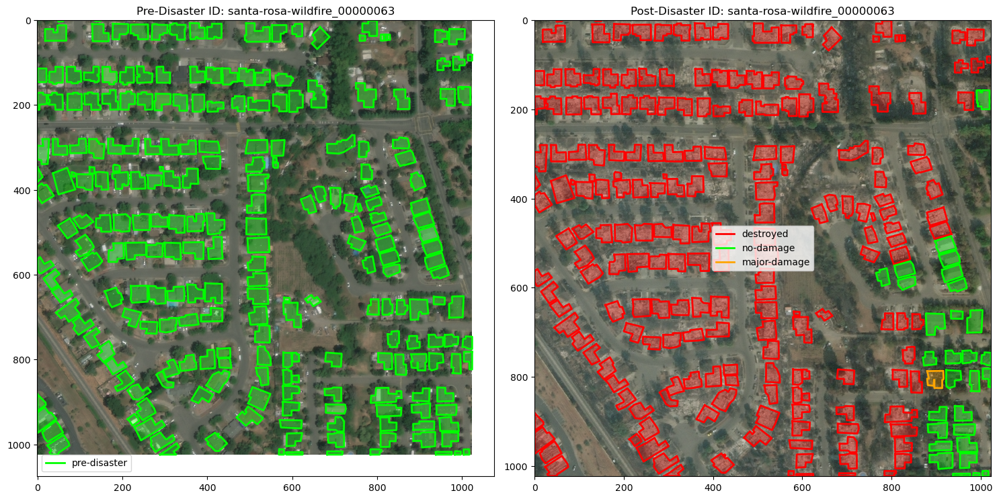


Damage Summary:
Pre-disaster building count: {'pre-disaster': 236}
Post-disaster building counts: {'destroyed': 206, 'no-damage': 29, 'major-damage': 1}


In [22]:
plot_disaster_comparison(106, df)

In [23]:
# Functions to clip and plot test images
def clip_image(image_path, corners):
    """
    Clip a GeoTIFF using four corner coordinates

    Args:
        image_path (str): Path to the GeoTIFF file
        corners (list): List of (lat,lon) coordinates defining the polygon corners
    """
    # Swap lat/lon to lon/lat for each corner
    swapped_corners = [(lon, lat) for lat, lon in corners]

    with rasterio.open(image_path) as src:
        # Create a polygon from the swapped corners
        polygon = Polygon(swapped_corners)

        # Create a GeoDataFrame with the polygon
        geo = gpd.GeoDataFrame({"geometry": [polygon]}, crs="EPSG:4326")

        # Perform the clip
        out_image, out_transform = mask(src, geo.geometry, crop=True)

        # Copy the metadata
        out_meta = src.meta.copy()

        # Update metadata
        out_meta.update(
            {
                "height": out_image.shape[1],
                "width": out_image.shape[2],
                "transform": out_transform,
            }
        )

        return out_image, out_meta


def plot_test_disaster_comparison(i, df):
    """
    Plot pre and post disaster images side by side

    Args:
        i (int): Index of the row in dataframe
        df (pd.DataFrame): Dataframe containing image paths
    """
    # Get paths and coordinates from dataframe
    row = df.iloc[i]
    pre_image_path = row.pre_image_path
    post_image_path = row.post_image_path
    id = row.id

    # Get corner coordinates
    pre_corners = [
        eval(row.pre_top_left.replace(";", ",")),
        eval(row.pre_top_right.replace(";", ",")),
        eval(row.pre_bottom_right.replace(";", ",")),
        eval(row.pre_bottom_left.replace(";", ",")),
    ]

    post_corners = [
        eval(row.post_top_left.replace(";", ",")),
        eval(row.post_top_right.replace(";", ",")),
        eval(row.post_bottom_right.replace(";", ",")),
        eval(row.post_bottom_left.replace(";", ",")),
    ]

    # Clip images
    pre_clipped, pre_meta = clip_image(pre_image_path, pre_corners)
    post_clipped, post_meta = clip_image(post_image_path, post_corners)

    # Create figure
    plt.figure(figsize=(20, 10))

    # Plot pre-disaster image
    plt.subplot(121)  # 1 row, 2 cols, 1st position
    plt.imshow(np.moveaxis(pre_clipped, 0, -1))
    plt.title(f"Pre-Disaster (ID: {id})")
    plt.axis("off")

    # Plot post-disaster image
    plt.subplot(122)  # 1 row, 2 cols, 2nd position
    plt.imshow(np.moveaxis(post_clipped, 0, -1))
    plt.title(f"Post-Disaster (ID: {id})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

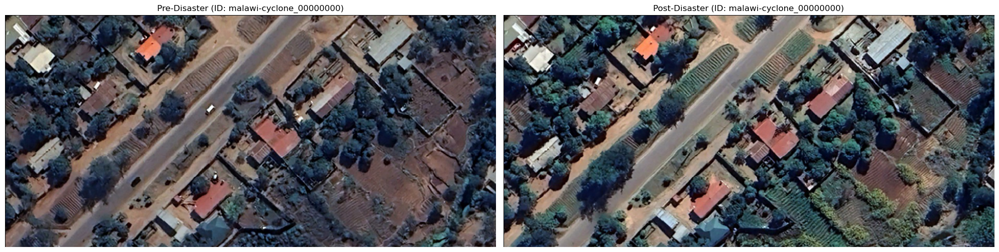

In [24]:
# preview some test images
plot_test_disaster_comparison(0, test_df)

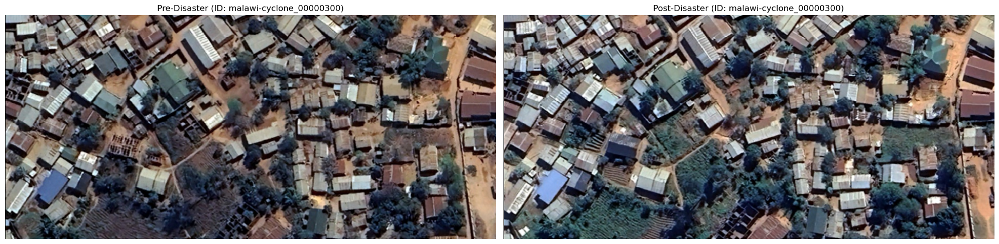

In [25]:
plot_test_disaster_comparison(
    300, test_df
)  # Model should be robust enough not to confuse buildings under construction as damaged or destroyed

#### Split data for training and validation

In [26]:
# Split data for training and validation
# You are free to use all data for training

train_df = df[df.dataset_type == "tier1"].reset_index(drop=True)
val_df = df[df.dataset_type == "test"].reset_index(drop=True)

# Retain only images that have bounds
train_df = train_df.dropna().replace([np.inf, -np.inf], np.nan).dropna()
val_df = val_df.dropna().replace([np.inf, -np.inf], np.nan).dropna()

train_df.shape, val_df.shape

((2283, 15), (752, 15))

In [27]:
train_df.flood_name.unique(), val_df.flood_name.unique(), test_df.flood_name.unique()

(array(['hurricane-michael', 'guatemala-volcano', 'midwest-flooding',
        'hurricane-matthew', 'hurricane-harvey', 'hurricane-florence',
        'palu-tsunami', 'socal-fire', 'mexico-earthquake',
        'santa-rosa-wildfire'], dtype=object),
 array(['hurricane-harvey', 'midwest-flooding', 'hurricane-florence',
        'socal-fire', 'hurricane-michael', 'hurricane-matthew',
        'palu-tsunami', 'santa-rosa-wildfire', 'mexico-earthquake',
        'guatemala-volcano'], dtype=object),
 array(['malawi-cyclone'], dtype=object))

#### Get start and end dates for disasters

In [28]:
# Add disaster dates - Search dates over the internet
disaster_dates = {
    "hurricane-michael": {"start_date": "2018-10-07", "end_date": "2018-10-16"},
    "guatemala-volcano": {"start_date": "2018-06-03", "end_date": "2018-06-03"},
    "midwest-flooding": {"start_date": "2019-03-15", "end_date": "2019-04-01"},
    "hurricane-matthew": {"start_date": "2016-09-28", "end_date": "2016-10-10"},
    "hurricane-harvey": {"start_date": "2017-08-17", "end_date": "2017-09-02"},
    "hurricane-florence": {"start_date": "2018-08-31", "end_date": "2018-09-18"},
    "palu-tsunami": {"start_date": "2018-09-28", "end_date": "2018-09-28"},
    "socal-fire": {"start_date": "2018-11-08", "end_date": "2018-11-25"},
    "mexico-earthquake": {"start_date": "2017-09-19", "end_date": "2017-09-19"},
    "santa-rosa-wildfire": {"start_date": "2017-10-08", "end_date": "2017-10-31"},
    "malawi-cyclone": {"start_date": "2023-03-11", "end_date": "2023-03-15"},
}

# Extract start and end dates into separate dictionaries
start_dates = {k: v["start_date"] for k, v in disaster_dates.items()}
end_dates = {k: v["end_date"] for k, v in disaster_dates.items()}

# Map the 'flood_name' to the corresponding dates
train_df["start_date"] = train_df["flood_name"].map(start_dates)
train_df["end_date"] = train_df["flood_name"].map(end_dates)

val_df["start_date"] = val_df["flood_name"].map(start_dates)
val_df["end_date"] = val_df["flood_name"].map(end_dates)

test_df["start_date"] = test_df["flood_name"].map(start_dates)
test_df["end_date"] = test_df["flood_name"].map(end_dates)

train_df.head()

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed,start_date,end_date
0,hurricane-michael_00000188,geotiffs/tier1/images/hurricane-michael_00000188_pre_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-michael_00000188_post_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_post_disaster.json,hurricane-michael,-85.670920,30.166169,-85.669488,30.170476,2,29,8,1,2018-10-07,2018-10-16
1,guatemala-volcano_00000025,geotiffs/tier1/images/guatemala-volcano_00000025_pre_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_pre_disaster.json,tier1,geotiffs/tier1/images/guatemala-volcano_00000025_post_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_post_disaster.json,guatemala-volcano,-90.829368,14.405336,-90.827739,14.409878,0,0,6,21,2018-06-03,2018-06-03
2,midwest-flooding_00000282,geotiffs/tier1/images/midwest-flooding_00000282_pre_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_pre_disaster.json,tier1,geotiffs/tier1/images/midwest-flooding_00000282_post_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_post_disaster.json,midwest-flooding,-96.362146,36.203281,-96.359496,36.206958,20,1,0,0,2019-03-15,2019-04-01
3,hurricane-matthew_00000234,geotiffs/tier1/images/hurricane-matthew_00000234_pre_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-matthew_00000234_post_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_post_disaster.json,hurricane-matthew,-74.126908,18.579172,-74.123442,18.580799,0,0,2,11,2016-09-28,2016-10-10
5,hurricane-harvey_00000081,geotiffs/tier1/images/hurricane-harvey_00000081_pre_disaster.tif,geotiffs/tier1/labels/hurricane-harvey_00000081_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-harvey_00000081_post_disaster.tif,geotiffs/tier1/labels/hurricane-harvey_00000081_post_disaster.json,hurricane-harvey,-95.357840,30.028510,-95.352965,30.032769,0,4,23,0,2017-08-17,2017-09-02


#### Download s2 data from aws - NDVI, NBR, NDWI, and NDMI

In [29]:
# Class to download S2 NDVI, NBR, NDWI, and NDMI indices from aws
# Feel free to use other bands to create more features
# Parallelize for faster downloads
class S3SatelliteDataFetcher:
    def __init__(
        self,
        api_url="https://earth-search.aws.element84.com/v1",
        bucket_name="sentinel-cogs",
    ):
        """Initialize STAC client and S3 client"""
        self.client = pystac_client.Client.open(api_url)
        self.s3_client = boto3.client(
            "s3", config=Config(signature_version=UNSIGNED), region_name="us-west-2"
        )
        self.bucket_name = bucket_name

        # Initialize the pyproj database
        pyproj.datadir.set_data_dir("/usr/share/proj")

    def get_https_url(self, s3_path):
        """Convert S3 path to HTTPS URL"""
        path = s3_path.replace("s3://sentinel-cogs/", "")
        return f"https://sentinel-cogs.s3.us-west-2.amazonaws.com/{path}"

    def search_scenes(
        self,
        geometry,
        date_range,
        cloud_cover=20,
        collection="sentinel-2-l2a",
        max_items=1,
    ):
        """Search for satellite scenes using STAC API"""
        query = {"eo:cloud_cover": {"lt": cloud_cover}}
        datetime_str = f"{date_range[0]}/{date_range[1]}"

        search = self.client.search(
            collections=[collection],
            intersects=geometry,
            datetime=datetime_str,
            query=query,
            max_items=max_items,
        )

        items = list(search.get_items())  # Convert iterator to list
        s3_paths = []
        for item in items:
            if "earthsearch:s3_path" in item.properties:
                s3_paths.append(item.properties["earthsearch:s3_path"])

        return items, s3_paths

    def download_raster(self, url_or_s3_path, bbox=None):
        """Download raster data from URL or S3 path with proper coordinate handling."""
        if url_or_s3_path.startswith("s3://"):
            url = self.get_https_url(url_or_s3_path)
        else:
            url = url_or_s3_path

        try:
            raster = rioxarray.open_rasterio(url)
        except:
            return None

        # Check CRS
        dst_crs = raster.rio.crs
        if dst_crs is None:
            # Assume a fallback CRS
            dst_crs = CRS.from_epsg(32632)
            raster = raster.rio.write_crs(dst_crs)

        if bbox is not None:
            try:
                # Source CRS: WGS84
                src_crs = CRS.from_epsg(4326)

                # Transform coordinates to the raster CRS
                transformer = Transformer.from_crs(src_crs, dst_crs, always_xy=True)
                minx, miny = transformer.transform(bbox[0], bbox[1])
                maxx, maxy = transformer.transform(bbox[2], bbox[3])

                # Clip the raster
                clipped_raster = raster.rio.clip_box(
                    minx=minx, miny=miny, maxx=maxx, maxy=maxy
                )
                # Check if the clipped data is empty
                if np.all(np.isnan(clipped_raster.values)):
                    return None
                raster = clipped_raster
            except:
                # Return full raster if clipping fails
                pass

        return raster


def get_scene_bands(
    min_lon, min_lat, max_lon, max_lat, start_date, end_date, cloud_cover=20
):
    fetcher = S3SatelliteDataFetcher()
    bbox = (min_lon, min_lat, max_lon, max_lat)
    polygon = box(min_lon, min_lat, max_lon, max_lat)

    items, s3_paths = fetcher.search_scenes(
        geometry=polygon,
        date_range=(start_date, end_date),
        cloud_cover=cloud_cover,
        max_items=1,
    )

    if not s3_paths:
        return None

    s3_path = s3_paths[0]

    required_bands = {
        "B3": "B03.tif",  # Green
        "B4": "B04.tif",  # Red
        "B8": "B08.tif",  # NIR (10m)
        "B11": "B11.tif",  # SWIR1 (20m)
        "B12": "B12.tif",  # SWIR2 (20m)
    }

    band_data = {}
    for b, filename in required_bands.items():
        url = f"{s3_path}/{filename}"
        raster = fetcher.download_raster(url, bbox=bbox)
        if raster is None:
            return None
        raster = raster.squeeze()
        if np.all(np.isnan(raster.values)):
            return None
        band_data[b] = raster

    # Use B8 as the reference band since it's 10m resolution
    ref_band = band_data["B8"]

    # Reproject/align each band to match B8
    for b in band_data:
        if b == "B8":
            continue
        band_data[b] = band_data[b].rio.reproject_match(ref_band)
        if np.all(np.isnan(band_data[b].values)):
            return None

    return band_data


def compute_indices(band_data):
    """
    Compute NDVI, NBR, NDWI, and NDMI from the band data.
    Each band_data[b] is a DataArray.
    Return a dict with mean values of these indices.
    """
    B3 = band_data["B3"].values.astype(np.float32)
    B4 = band_data["B4"].values.astype(np.float32)
    B8 = band_data["B8"].values.astype(np.float32)
    B11 = band_data["B11"].values.astype(np.float32)
    B12 = band_data["B12"].values.astype(np.float32)

    # Avoid division by zero
    eps = 1e-10

    # Compute indices
    NDVI = (B8 - B4) / (B8 + B4 + eps)
    NBR = (B8 - B12) / (B8 + B12 + eps)
    NDWI = (B3 - B8) / (B3 + B8 + eps)
    NDMI = (B8 - B11) / (B8 + B11 + eps)

    # Compute mean values
    return {
        "NDVI_mean": float(np.nanmean(NDVI)),
        "NBR_mean": float(np.nanmean(NBR)),
        "NDWI_mean": float(np.nanmean(NDWI)),
        "NDMI_mean": float(np.nanmean(NDMI)),
    }


def process_row(row, cloud_cover=20):
    """
    Process a single row from the DataFrame.
    Retrieves band data, computes indices, and returns a dictionary of values.
    If no scene is found or bands are invalid, return None values.
    """
    img_id = row["id"]
    min_lon = row["post_min_lon"]
    min_lat = row["post_min_lat"]
    max_lon = row["post_max_lon"]
    max_lat = row["post_max_lat"]
    start_date = str(row["start_date"])
    end_date = str(row["end_date"])

    band_data = get_scene_bands(
        min_lon,
        min_lat,
        max_lon,
        max_lat,
        start_date,
        end_date,
        cloud_cover=cloud_cover,
    )
    if band_data is None:
        return {
            "id": img_id,
            "NDVI_mean": None,
            "NBR_mean": None,
            "NDWI_mean": None,
            "NDMI_mean": None,
        }

    indices = compute_indices(band_data)
    indices["id"] = img_id
    return indices


def parallel_process(df, cloud_cover=20, n_processes=4):
    """
    Parallelize processing of rows to compute NDVI, NBR, NDWI, NDMI for each id.
    Returns a DataFrame with these values.
    """
    rows = [row for _, row in df.iterrows()]
    func = partial(process_row, cloud_cover=cloud_cover)

    results = []
    with multiprocessing.Pool(processes=n_processes) as pool:
        for res in tqdm(
            pool.imap_unordered(func, rows), total=len(rows), desc="Processing"
        ):
            results.append(res)

    results_df = pd.DataFrame(results)
    # If 'id' exists in both dataframes, align the result.
    if "id" in df.columns and "id" in results_df.columns:
        results_df = results_df.set_index("id").reindex(df["id"]).reset_index()

    return results_df

In [ ]:
# # Extract and generate NDVI, NBR, NDWI, and NDMI from s2 data in aws
train_s2_df = parallel_process(train_df, n_processes=4)
val_s2_df = parallel_process(val_df, n_processes=4)
test_s2_df = parallel_process(test_df, n_processes=4)
val_s2_df.shape, test_s2_df.shape, train_s2_df.shape

In [ ]:
# # Fill NaN values with median
fill_cols = train_s2_df.columns.tolist()[1:]
train_s2_df[fill_cols] = train_s2_df[fill_cols].fillna(train_s2_df[fill_cols].median())
val_s2_df[fill_cols] = val_s2_df[fill_cols].fillna(val_s2_df[fill_cols].median())
test_s2_df[fill_cols] = test_s2_df[fill_cols].fillna(
    train_s2_df[fill_cols].median()
)  # No data was available for test, fill with train median

train_s2_df.isnull().sum().any(), val_s2_df.isnull().sum().any(), test_s2_df.isnull().sum().any()

In [ ]:
train_df = train_df.merge(train_s2_df, how="left", on="id")
val_df = val_df.merge(val_s2_df, how="left", on="id")
test_df = test_df.merge(test_s2_df, how="left", on="id")

train_df.head()

,id,pre_image_path,pre_label_path,dataset_type,post_image_path,post_label_path,flood_name,post_min_lon,post_min_lat,post_max_lon,post_max_lat,no-damage,minor-damage,major-damage,destroyed,start_date,end_date,NDVI_mean,NBR_mean,NDWI_mean,NDMI_mean
0,hurricane-michael_00000188,geotiffs/tier1/images/hurricane-michael_00000188_pre_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-michael_00000188_post_disaster.tif,geotiffs/tier1/labels/hurricane-michael_00000188_post_disaster.json,hurricane-michael,-85.670920,30.166169,-85.669488,30.170476,2,29,8,1,2018-10-07,2018-10-16,0.404164,0.170653,-0.432254,0.010332
1,guatemala-volcano_00000025,geotiffs/tier1/images/guatemala-volcano_00000025_pre_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_pre_disaster.json,tier1,geotiffs/tier1/images/guatemala-volcano_00000025_post_disaster.tif,geotiffs/tier1/labels/guatemala-volcano_00000025_post_disaster.json,guatemala-volcano,-90.829368,14.405336,-90.827739,14.409878,0,0,6,21,2018-06-03,2018-06-03,0.368661,0.156551,-0.420255,0.014477
2,midwest-flooding_00000282,geotiffs/tier1/images/midwest-flooding_00000282_pre_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_pre_disaster.json,tier1,geotiffs/tier1/images/midwest-flooding_00000282_post_disaster.tif,geotiffs/tier1/labels/midwest-flooding_00000282_post_disaster.json,midwest-flooding,-96.362146,36.203281,-96.359496,36.206958,20,1,0,0,2019-03-15,2019-04-01,0.453262,0.149907,-0.536270,-0.057138
3,hurricane-matthew_00000234,geotiffs/tier1/images/hurricane-matthew_00000234_pre_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-matthew_00000234_post_disaster.tif,geotiffs/tier1/labels/hurricane-matthew_00000234_post_disaster.json,hurricane-matthew,-74.126908,18.579172,-74.123442,18.580799,0,0,2,11,2016-09-28,2016-10-10,0.368661,0.156551,-0.420255,0.014477
4,hurricane-harvey_00000081,geotiffs/tier1/images/hurricane-harvey_00000081_pre_disaster.tif,geotiffs/tier1/labels/hurricane-harvey_00000081_pre_disaster.json,tier1,geotiffs/tier1/images/hurricane-harvey_00000081_post_disaster.tif,geotiffs/tier1/labels/hurricane-harvey_00000081_post_disaster.json,hurricane-harvey,-95.357840,30.028510,-95.352965,30.032769,0,4,23,0,2017-08-17,2017-09-02,0.643730,0.443848,-0.596921,0.164120


#### Modelling

In [34]:
from torchvision.transforms import functional as TF


class Resize(object):
    def __init__(self, size):
        self.size = size  # size should be a tuple (height, width)

    def __call__(self, image, target):
        orig_width, orig_height = image.size
        image = TF.resize(image, self.size)

        ratio_width = self.size[0] / orig_width
        ratio_height = self.size[1] / orig_height

        if "boxes" in target:
            boxes = target["boxes"]
            boxes[:, [0, 2]] = boxes[:, [0, 2]] * ratio_width
            boxes[:, [1, 3]] = boxes[:, [1, 3]] * ratio_height
            target["boxes"] = boxes

        if "masks" in target:
            masks = target["masks"]
            masks = masks.unsqueeze(1)  # Add channel dimension
            masks = TF.resize(
                masks, self.size, interpolation=TF.InterpolationMode.NEAREST
            )
            masks = masks.squeeze(1)
            target["masks"] = masks

        return image, target


class BuildingDataset(Dataset):
    def __init__(self, df, resize_size=(512, 512)):
        self.df = df.reset_index(drop=True)
        self.resize_size = resize_size
        self.damage_class_to_id = {
            "no-damage": 1,
            "minor-damage": 2,
            "major-damage": 3,
            "destroyed": 4,
        }

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row.post_image_path
        label_path = row.post_label_path
        NDVI_mean = torch.tensor(row.NDVI_mean)
        NBR_mean = torch.tensor(row.NBR_mean)
        NDWI_mean = torch.tensor(row.NDWI_mean)
        NDMI_mean = torch.tensor(row.NDMI_mean)
        image_id = torch.tensor([idx])

        with rasterio.open(img_path) as src:
            img_array = src.read()
            if img_array.shape[0] >= 3:
                img_array = img_array[:3, :, :]
            else:
                img_array = np.repeat(img_array, 3, axis=0)

            img_array = np.transpose(img_array, (1, 2, 0)).astype(np.uint8)
            img = Image.fromarray(img_array)

        width, height = img.size

        with open(label_path, "r") as f:
            annotations = json.load(f)

        boxes = []
        labels = []
        masks = []
        annotations = annotations["features"]["xy"]

        for annotation in annotations:
            properties = annotation["properties"]
            subtype = properties["subtype"]
            damage_label = self.damage_class_to_id.get(subtype, 0)

            polygon_wkt = annotation["wkt"]
            polygon = loads(polygon_wkt)

            if not polygon.is_valid:
                continue

            polygon = self._clip_polygon_to_image(polygon, width, height)
            if polygon.is_empty:
                continue

            xmin, ymin, xmax, ymax = polygon.bounds
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(damage_label)

            mask = self._polygon_to_mask(polygon, width, height)
            masks.append(mask)

        if len(boxes) == 0:
            target = {
                "boxes": torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64),
                "masks": torch.zeros((0, height, width), dtype=torch.uint8),
                "image_id": image_id,
            }
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            masks = torch.as_tensor(np.stack(masks, axis=0), dtype=torch.uint8)

            target = {
                "boxes": boxes,
                "labels": labels,
                "masks": masks,
                "image_id": image_id,
            }

        resize_transform = Resize(self.resize_size)
        img, target = resize_transform(img, target)

        # Use TF.to_tensor instead of F.to_tensor
        img = TF.to_tensor(img)

        return {
            "img": img,
            "target": target,
            "NDVI_mean": NDVI_mean,
            "NBR_mean": NBR_mean,
            "NDMI_mean": NDMI_mean,
            "NDWI_mean": NDWI_mean,
        }

    def __len__(self):
        return len(self.df)

    def _polygon_to_mask(self, polygon, width, height):
        mask = Image.new("L", (width, height), 0)
        draw = ImageDraw.Draw(mask)

        if polygon.is_empty:
            return np.array(mask, dtype=np.uint8)

        if polygon.geom_type == "Polygon":
            if polygon.exterior is not None:
                x, y = polygon.exterior.coords.xy
                coords = [(xi, yi) for xi, yi in zip(x, y)]
                draw.polygon(coords, outline=1, fill=1)
        elif polygon.geom_type == "MultiPolygon":
            for poly in polygon.geoms:
                if poly.exterior is not None:
                    x, y = poly.exterior.coords.xy
                    coords = [(xi, yi) for xi, yi in zip(x, y)]
                    draw.polygon(coords, outline=1, fill=1)

        return np.array(mask, dtype=np.uint8)

    def _clip_polygon_to_image(self, polygon, width, height):
        image_box = box(0, 0, width, height)
        return polygon.intersection(image_box)

In [35]:
# Instantiate dataset
train_dataset = BuildingDataset(train_df, resize_size=(512, 512))

In [36]:
# Function to plot image and its target
def plot_image_and_targets(img_tensor, target):
    """
    Plots the original image and the image with bounding boxes side by side.

    Args:
        img_tensor (torch.Tensor): The image tensor of shape [C, H, W].
        target (dict): The target dictionary containing 'boxes' and 'labels'.
    """
    # Convert image tensor to NumPy array and transpose to [H, W, C]
    img = img_tensor.permute(1, 2, 0).numpy()
    img = (img * 255).astype(np.uint8)

    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Plot the original image on the left
    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot the image with bounding boxes on the right
    axes[1].imshow(img)
    axes[1].set_title("Image with Bounding Boxes")
    axes[1].axis("off")

    # Get bounding boxes and labels
    boxes = target["boxes"]
    labels = target["labels"]

    # Define a dictionary to map label IDs to class names
    damage_class_to_id = {
        "no-damage": 1,
        "minor-damage": 2,
        "major-damage": 3,
        "destroyed": 4,
    }
    id_to_damage_class = {v: k for k, v in damage_class_to_id.items()}

    # Plot each bounding box
    for idx in range(len(boxes)):
        box = boxes[idx]
        label = labels[idx].item()
        class_name = id_to_damage_class.get(label, "Unknown")

        xmin, ymin, xmax, ymax = box

        # Create a Rectangle patch
        rect = plt.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )

        # Add the rectangle to the Axes
        axes[1].add_patch(rect)

        # Add label text
        axes[1].text(
            xmin,
            ymin - 5,
            f"{class_name}",
            color="yellow",
            fontsize=12,
            backgroundcolor="black",
        )

    plt.tight_layout()
    plt.show()

#### EDA on dataloader batches

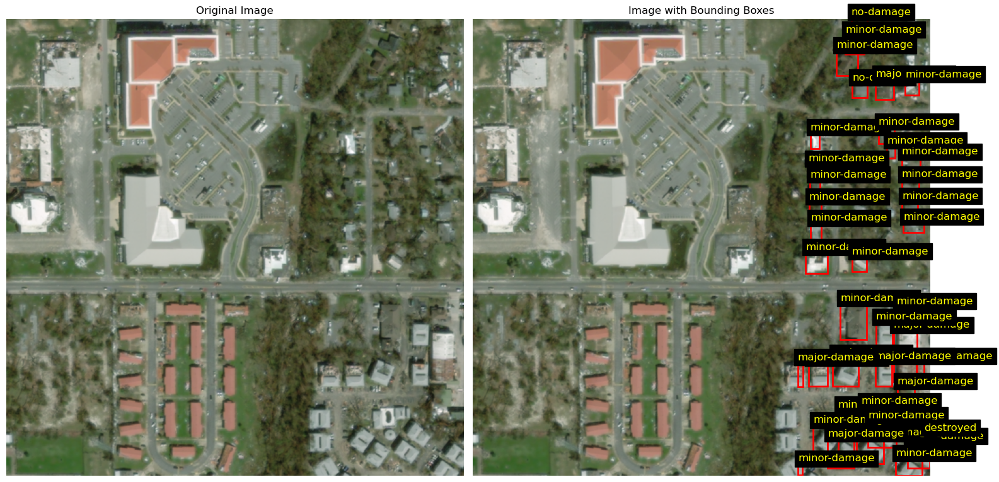

In [37]:
# Get a sample from the dataset
batch = train_dataset[0]  # You can change the index as needed

img_tensor, target = batch["img"], batch["target"]

# Plot the image and targets with bounding boxes side by side
plot_image_and_targets(img_tensor, target)

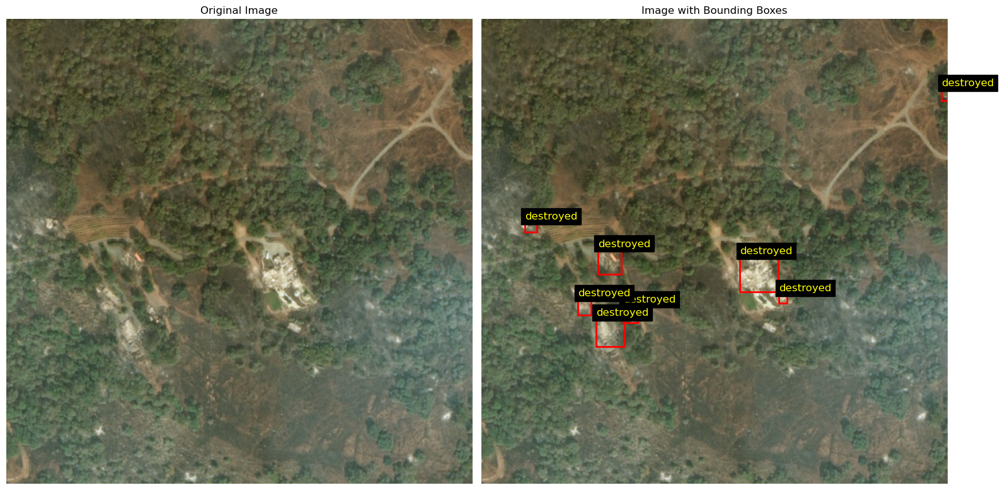

In [38]:
# Get a sample from the dataset
batch = train_dataset[20]  # You can change the index as needed

img_tensor, target = batch["img"], batch["target"]

# Plot the image and targets with bounding boxes side by side
plot_image_and_targets(img_tensor, target)

#### Train model and evaluate model

In [39]:
# Instantiate the training and validation datasets
train_dataset = BuildingDataset(train_df, resize_size=(512, 512))
val_dataset = BuildingDataset(val_df, resize_size=(512, 512))


def collate_fn(batch):
    # Extract each component from the batch of dictionaries
    imgs = [item["img"] for item in batch]
    targets = [item["target"] for item in batch]
    NDVI_means = [item["NDVI_mean"] for item in batch]
    NBR_means = [item["NBR_mean"] for item in batch]
    NDMI_means = [item["NDMI_mean"] for item in batch]
    NDWI_means = [item["NDWI_mean"] for item in batch]
    return imgs, targets, NDVI_means, NBR_means, NDMI_means, NDWI_means


# Create DataLoaders for training and validation
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=8,
    collate_fn=collate_fn,
)

valid_loader = DataLoader(
    val_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=8,
    collate_fn=collate_fn,
)


def get_maskrcnn_model(num_classes=5):
    # Load a Mask R-CNN model pre-trained on COCO
    model = maskrcnn_resnet50_fpn(pretrained=True)

    # Replace the bounding box predictor for the correct number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the mask predictor for the correct number of classes
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )

    return model


# Initialize the model
model = get_maskrcnn_model(num_classes=5)
model = model.cuda()  # Move to GPU if available
model.train()  # Set to training mode

# Define an optimizer
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
num_epochs = 10

for epoch in range(num_epochs):
    # Training loop
    for batch_idx, batch in enumerate(train_loader):
        # Unpack the batch
        imgs, targets, NDVI_means, NBR_means, NDMI_means, NDWI_means = batch

        # Move images and targets to GPU if available
        imgs = [img.cuda() for img in imgs]
        targets = [
            {k: v.cuda() if torch.is_tensor(v) else v for k, v in t.items()}
            for t in targets
        ]

        # Forward pass through the model to compute losses
        losses_dict = model(imgs, targets)
        losses = sum(loss for loss in losses_dict.values())

        # Backpropagation and optimization
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Print training progress every 10 batches
        if batch_idx % 40 == 0:
            print(
                f"Epoch [{epoch+1}/{num_epochs}] Batch [{batch_idx}] Loss: {losses.item():.4f}"
            )

    # After each epoch, evaluate on the validation set
    model.eval()  # Set model to evaluation mode

    # Initialize accumulators for Mean Absolute Error (MAE)
    # We'll track total absolute difference for each class and count how many samples we've processed.
    sum_abs_diff_per_class = {c: 0 for c in range(1, 5)}
    total_images = 0

    with torch.no_grad():
        for batch_idx, batch in enumerate(valid_loader):
            imgs, targets, NDVI_means, NBR_means, NDMI_means, NDWI_means = batch
            imgs = [img.cuda() for img in imgs]

            # Run inference
            predictions = model(imgs)

            # For each image in the batch, calculate the predicted and ground truth counts per class
            for pred, gt in zip(predictions, targets):
                # Extract predicted counts
                pred_counts = {
                    c: (pred["labels"] == c).sum().item() for c in range(1, 5)
                }

                # Extract ground truth counts
                gt_counts = {c: (gt["labels"] == c).sum().item() for c in range(1, 5)}

                # Accumulate the absolute differences for each class
                for c in range(1, 5):
                    diff = abs(pred_counts[c] - gt_counts[c])
                    sum_abs_diff_per_class[c] += diff

                total_images += 1

    # Compute MAE per class and overall MAE
    # MAE per class: (Sum of absolute differences for that class) / (Number of images)
    mae_per_class = {c: sum_abs_diff_per_class[c] / total_images for c in range(1, 5)}

    # Overall MAE: Average of MAEs across all classes
    overall_mae = sum(mae_per_class.values()) / len(mae_per_class)

    # Print validation results
    print(f"Epoch [{epoch+1}/{num_epochs}] Validation MAE per class: {mae_per_class}")
    print(
        f"Epoch [{epoch+1}/{num_epochs}] Validation Overall MAE: {overall_mae:.4f} \n"
    )

    # Return the model to training mode for the next epoch
    model.train()

Epoch [1/10] Batch [0] Loss: 8.9954
Epoch [1/10] Batch [40] Loss: 2.0850
Epoch [1/10] Validation MAE per class: {1: 72.46409574468085, 2: 9.456117021276595, 3: 13.533244680851064, 4: 5.397606382978723}
Epoch [1/10] Validation Overall MAE: 25.2128 

Epoch [2/10] Batch [0] Loss: 1.8103
Epoch [2/10] Batch [40] Loss: 1.9323
Epoch [2/10] Validation MAE per class: {1: 51.316489361702125, 2: 11.230053191489361, 3: 10.715425531914894, 4: 11.047872340425531}
Epoch [2/10] Validation Overall MAE: 21.0775 

Epoch [3/10] Batch [0] Loss: 1.6056
Epoch [3/10] Batch [40] Loss: 1.7684
Epoch [3/10] Validation MAE per class: {1: 57.336436170212764, 2: 9.996010638297872, 3: 9.16622340425532, 4: 15.73404255319149}
Epoch [3/10] Validation Overall MAE: 23.0582 

Epoch [4/10] Batch [0] Loss: 1.5599
Epoch [4/10] Batch [40] Loss: 1.6213
Epoch [4/10] Validation MAE per class: {1: 51.829787234042556, 2: 11.29122340425532, 3: 10.827127659574469, 4: 15.803191489361701}
Epoch [4/10] Validation Overall MAE: 22.4378 



#### make predictions on test dataset

In [40]:
# Test dataset class
class TestDataset(Dataset):
    """
    A PyTorch Dataset class for test images of buildings.
    This dataset returns a dictionary similar to the training dataset but without targets:
    {
        "img": Tensor(C,H,W),
        "NDVI_mean": Tensor(1),
        "NBR_mean" : Tensor(1),
        "NDMI_mean": Tensor(1),
        "NDWI_mean": Tensor(1),
        "img_id": <image identifier>
    }
    """

    def __init__(self, df, resize_size=(512, 512)):
        """
        Args:
            df (pd.DataFrame): A dataframe containing test image paths and their metadata.
                               It should have columns like 'post_image_path', 'id', and the vegetation indices.
            resize_size (tuple): The (height, width) to resize images to.
        """
        self.df = df.reset_index(drop=True)
        self.resize_size = resize_size

    def __getitem__(self, idx):
        """
        Loads and preprocesses an image and its associated metadata from the test dataset.

        Args:
            idx (int): The index of the image in the dataset.

        Returns:
            dict: {
                "img": preprocessed image tensor,
                "NDVI_mean": mean NDVI value (float tensor),
                "NBR_mean": mean NBR value (float tensor),
                "NDMI_mean": mean NDMI value (float tensor),
                "NDWI_mean": mean NDWI value (float tensor),
                "img_id": unique identifier for the image
            }
        """
        row = self.df.iloc[idx]
        img_path = row.post_image_path
        img_id = row.id

        # Extract vegetation indices from dataframe row
        NDVI_mean = torch.tensor(row.NDVI_mean, dtype=torch.float32)
        NBR_mean = torch.tensor(row.NBR_mean, dtype=torch.float32)
        NDMI_mean = torch.tensor(row.NDMI_mean, dtype=torch.float32)
        NDWI_mean = torch.tensor(row.NDWI_mean, dtype=torch.float32)

        # Load image with rasterio
        with rasterio.open(img_path) as src:
            img_array = src.read()  # shape: (C, H, W)

            # Ensure at least 3 channels (R,G,B)
            if img_array.shape[0] >= 3:
                img_array = img_array[:3, :, :]
            else:
                # If fewer than 3 channels, replicate to make it appear like an RGB image
                img_array = np.repeat(img_array, 3, axis=0)

            # Convert to H x W x C and uint8
            img_array = np.transpose(img_array, (1, 2, 0)).astype(np.uint8)

            # Convert to PIL Image
            img = Image.fromarray(img_array)

        # Resize and convert to tensor
        img = F.resize(img, self.resize_size)
        img = F.to_tensor(img)

        return {
            "img": img,
            "NDVI_mean": NDVI_mean,
            "NBR_mean": NBR_mean,
            "NDMI_mean": NDMI_mean,
            "NDWI_mean": NDWI_mean,
            "img_id": img_id,
        }

    def __len__(self):
        return len(self.df)


def test_collate_fn(batch):
    """
    Collate function for the test dataset, similar to the training collate function,
    but excluding targets. It returns:
    (imgs, NDVI_means, NBR_means, NDMI_means, NDWI_means, img_ids)

    Args:
        batch (list): A list of samples from the TestDataset.

    Returns:
        tuple: (imgs, NDVI_means, NBR_means, NDMI_means, NDWI_means, img_ids)
    """
    imgs = [item["img"] for item in batch]
    NDVI_means = [item["NDVI_mean"] for item in batch]
    NBR_means = [item["NBR_mean"] for item in batch]
    NDMI_means = [item["NDMI_mean"] for item in batch]
    NDWI_means = [item["NDWI_mean"] for item in batch]
    img_ids = [item["img_id"] for item in batch]

    return imgs, NDVI_means, NBR_means, NDMI_means, NDWI_means, img_ids


# Create the test dataset and DataLoader
test_dataset = TestDataset(test_df, resize_size=(512, 512))
test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=8,
    collate_fn=test_collate_fn,
)

damage_class_to_id = {
    "no-damage": 1,
    "minor-damage": 2,
    "major-damage": 3,
    "destroyed": 4,
}
id_to_damage_class = {v: k for k, v in damage_class_to_id.items()}


def predict_and_count(model, data_loader, device, score_threshold=0.5):
    """
    Run inference with the model on the test data and count the number of buildings per class per image.
    Now we also have vegetation indices and img_ids for reference, but they are not directly used in counting.

    Args:
        model (nn.Module): The trained Mask R-CNN model.
        data_loader (DataLoader): DataLoader for the test dataset.
        device (torch.device): The device to run inference on (CPU or GPU).
        score_threshold (float): Minimum score threshold for counting a prediction.

    Returns:
        list of dict: A list of dictionaries, each containing:
            {
              "img_id": <image identifier>,
              "counts": {
                "no-damage": int,
                "minor-damage": int,
                "major-damage": int,
                "destroyed": int
              }
            }
    """
    model.eval()
    image_counts = []

    with torch.no_grad():
        for imgs, NDVI_means, NBR_means, NDMI_means, NDWI_means, img_ids in tqdm(
            data_loader, desc="Inference"
        ):
            # Move images to the device
            imgs = [img.to(device) for img in imgs]

            # Run the model
            outputs = model(imgs)

            for i, output in enumerate(outputs):
                img_id = img_ids[i]

                # Filter predictions by score threshold
                scores = output["scores"].cpu()
                keep = scores >= score_threshold
                labels = output["labels"][keep].cpu().numpy()

                # Count instances per class
                counts = {class_name: 0 for class_name in damage_class_to_id.keys()}
                for label in labels:
                    class_name = id_to_damage_class.get(label, "unknown")
                    if class_name in counts:
                        counts[class_name] += 1

                # Store the results for this image
                image_counts.append({"img_id": img_id, "counts": counts})

    return image_counts


# Example usage (assuming `model` and `device` are already defined):
device = "cuda"
model.eval()
predictions = predict_and_count(model, test_loader, device, score_threshold=0.5)

Inference:   0%|          | 0/6 [00:00<?, ?it/s]

#### Prepare submission file

In [41]:
# Create sub file
rows = []

# Loop over each image's counts
for entry in predictions:
    img_id = entry["img_id"]
    counts = entry["counts"]

    # For each damage class, create a row
    for damage_class, count in counts.items():
        # Format the damage class to replace hyphens with underscores
        damage_class_formatted = damage_class.replace("-", "_")
        # Construct the 'id' as per your required format
        row_id = f"{img_id}_X_{damage_class_formatted}"
        # Append the row to the list
        rows.append({"id": row_id, "target": count})

# Create the DataFrame
sub_df = pd.DataFrame(rows)

# Sort the DataFrame by 'id'
sub_df = sub_df.sort_values("id").reset_index(drop=True)

sub_df

,id,target
0,malawi-cyclone_00000000_X_destroyed,0
1,malawi-cyclone_00000000_X_major_damage,0
2,malawi-cyclone_00000000_X_minor_damage,0
3,malawi-cyclone_00000000_X_no_damage,30
4,malawi-cyclone_00000001_X_destroyed,0
...,...,...
1387,malawi-cyclone_00000346_X_no_damage,48
1388,malawi-cyclone_00000347_X_destroyed,0
1389,malawi-cyclone_00000347_X_major_damage,0
1390,malawi-cyclone_00000347_X_minor_damage,0


In [42]:
sub_df.to_csv("benchmark.csv", index=False)